In [2]:
import json
import pandas as pd
import numpy as np
import re
import warnings
import folium
warnings.filterwarnings('ignore')

In [3]:
file1_path = "C:/Users/yanfe/OneDrive/Desktop/review.json"

review = []

with open(file1_path, 'r', encoding='utf-8') as file:
    for line in file:
        json_object = json.loads(line)
        review.append(json_object)

In [15]:
file1_path = "C:/Users/yanfe/OneDrive/Desktop/business.json"

business = []

with open(file1_path, 'r', encoding='utf-8') as file:
    for line in file:
        json_object = json.loads(line)
        business.append(json_object)


In [17]:
import seaborn as sns
import matplotlib.pyplot as plt
df = pd.DataFrame(business)
rv = pd.DataFrame(review)

In [23]:
star= rv['stars']
dates=rv['date']
ids=rv["business_id"]
new_rv=pd.DataFrame({'stars':star, 'date':dates,"business_id":ids})


In [47]:
df1 = df[df['categories'].str.contains('bars', na= False, case = False)]

In [52]:
len(df['business_id'].unique())

150346

In [30]:
merged_df = pd.merge(df1, new_rv, on='business_id', how='inner')
merged_df.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars_x,review_count,is_open,attributes,categories,hours,stars_y,date
0,k0hlBqXX-Bt0vf1op7Jr1w,Tsevi's Pub And Grill,8025 Mackenzie Rd,Affton,MO,63123,38.565165,-90.321087,3.0,19,0,"{'Caters': 'True', 'Alcohol': 'u'full_bar'', '...","Pubs, Restaurants, Italian, Bars, American (Tr...",None,4.0,2014-02-25 22:34:59
1,k0hlBqXX-Bt0vf1op7Jr1w,Tsevi's Pub And Grill,8025 Mackenzie Rd,Affton,MO,63123,38.565165,-90.321087,3.0,19,0,"{'Caters': 'True', 'Alcohol': 'u'full_bar'', '...","Pubs, Restaurants, Italian, Bars, American (Tr...",None,4.0,2013-01-29 04:27:04
2,k0hlBqXX-Bt0vf1op7Jr1w,Tsevi's Pub And Grill,8025 Mackenzie Rd,Affton,MO,63123,38.565165,-90.321087,3.0,19,0,"{'Caters': 'True', 'Alcohol': 'u'full_bar'', '...","Pubs, Restaurants, Italian, Bars, American (Tr...",None,2.0,2013-10-25 15:39:01
3,k0hlBqXX-Bt0vf1op7Jr1w,Tsevi's Pub And Grill,8025 Mackenzie Rd,Affton,MO,63123,38.565165,-90.321087,3.0,19,0,"{'Caters': 'True', 'Alcohol': 'u'full_bar'', '...","Pubs, Restaurants, Italian, Bars, American (Tr...",None,1.0,2014-07-16 19:17:34
4,k0hlBqXX-Bt0vf1op7Jr1w,Tsevi's Pub And Grill,8025 Mackenzie Rd,Affton,MO,63123,38.565165,-90.321087,3.0,19,0,"{'Caters': 'True', 'Alcohol': 'u'full_bar'', '...","Pubs, Restaurants, Italian, Bars, American (Tr...",None,1.0,2012-12-17 18:37:23


In [35]:
columns_to_drop = ['business_id',"stars_y",'date']
new_df = merged_df[columns_to_drop]

In [44]:
merged_df1 = merged_df[merged_df['state'].isin(['AB','XMS'])]
merged_df2 = merged_df1[['business_id','state']]

In [46]:
merged_df.to_csv('merged_df.csv', index = False)

In [54]:
df1.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
8,k0hlBqXX-Bt0vf1op7Jr1w,Tsevi's Pub And Grill,8025 Mackenzie Rd,Affton,MO,63123,38.565165,-90.321087,3.0,19,0,"{'Caters': 'True', 'Alcohol': 'u'full_bar'', '...","Pubs, Restaurants, Italian, Bars, American (Tr...",None
15,MUTTqe8uqyMdBl186RmNeA,Tuna Bar,205 Race St,Philadelphia,PA,19106,39.953949,-75.143226,4.0,245,1,"{'RestaurantsReservations': 'True', 'Restauran...","Sushi Bars, Restaurants, Japanese","{'Tuesday': '13:30-22:0', 'Wednesday': '13:30-..."
20,WKMJwqnfZKsAae75RMP6jA,Roast Coffeehouse and Wine Bar,10359 104 Street NW,Edmonton,AB,T5J 1B9,53.546045,-113.499169,4.0,40,0,"{'OutdoorSeating': 'False', 'Caters': 'True', ...","Coffee & Tea, Food, Cafes, Bars, Wine Bars, Re...","{'Monday': '8:0-18:0', 'Tuesday': '8:0-18:0', ..."
28,QdN72BWoyFypdGJhhI5r7g,Bar One,767 S 9th St,Philadelphia,PA,19147,39.939825,-75.157447,4.0,65,0,"{'Smoking': 'u'no'', 'NoiseLevel': 'u'average'...","Cocktail Bars, Bars, Italian, Nightlife, Resta...","{'Monday': '16:0-0:0', 'Tuesday': '16:0-0:0', ..."
47,lk9IwjZXqUMqqOhM774DtQ,Caviar & Bananas,2031 Broadway,Nashville,TN,37203,36.148371,-86.798895,3.5,159,0,"{'RestaurantsTakeOut': 'True', 'RestaurantsRes...","Coffee & Tea, Restaurants, Wine Bars, Bars, Ni...","{'Monday': '7:0-17:0', 'Tuesday': '7:0-17:0', ..."


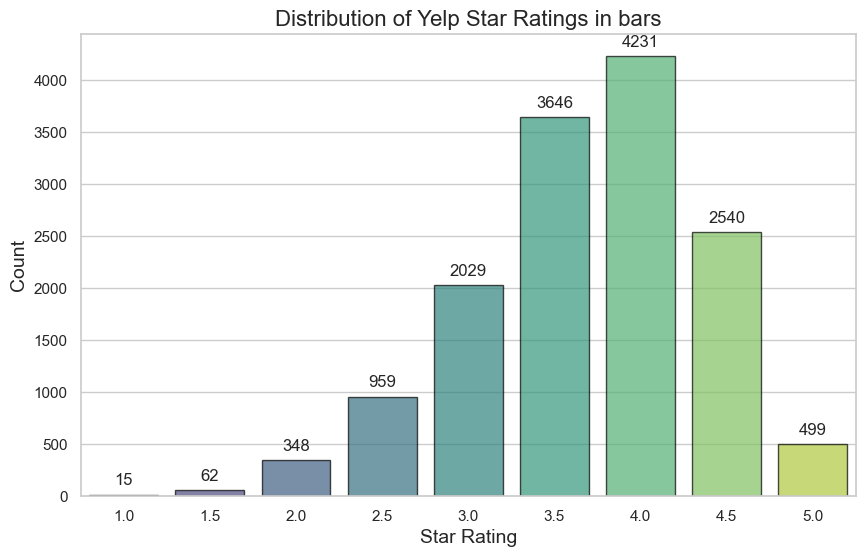

In [55]:
sns.set(style="whitegrid")

# Create a fancier bar plot
plt.figure(figsize=(10, 6))
ax = sns.countplot(x="stars", data=df1, palette="viridis", edgecolor="black", alpha=0.7)

# Add labels and title
ax.set_title("Distribution of Yelp Star Ratings in bars", fontsize=16)
ax.set_xlabel("Star Rating", fontsize=14)
ax.set_ylabel("Count", fontsize=14)

# Add text on bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points', fontsize=12)

# Show the plot
plt.show()

In [47]:
df_r = pd.DataFrame(review)

In [63]:
map_center = [il_df["latitude"].mean(), il_df["longitude"].mean()]
my_map = folium.Map(location=map_center, zoom_start=6)

# Add markers to the map
for index, location in df[(df.state.str.contains("PA"))&(df.categories.str.contains("taurants"))].iterrows():
    folium.Marker(
        location=[location["latitude"], location["longitude"]],
        popup=location["name"],
        icon=folium.Icon(color='blue', icon='cutlery', prefix='fa')
    ).add_to(my_map)

# Save or display the map
my_map.save("interactive_map.html")
my_map

In [61]:
df.head(6)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."
5,CF33F8-E6oudUQ46HnavjQ,Sonic Drive-In,615 S Main St,Ashland City,TN,37015,36.269593,-87.058943,2.0,6,1,"{'BusinessParking': 'None', 'BusinessAcceptsCr...","Burgers, Fast Food, Sandwiches, Food, Ice Crea...","{'Monday': '0:0-0:0', 'Tuesday': '6:0-22:0', '..."


In [5]:
dff = df[df['categories'].str.contains('Restaurant', case=False, na=False)]

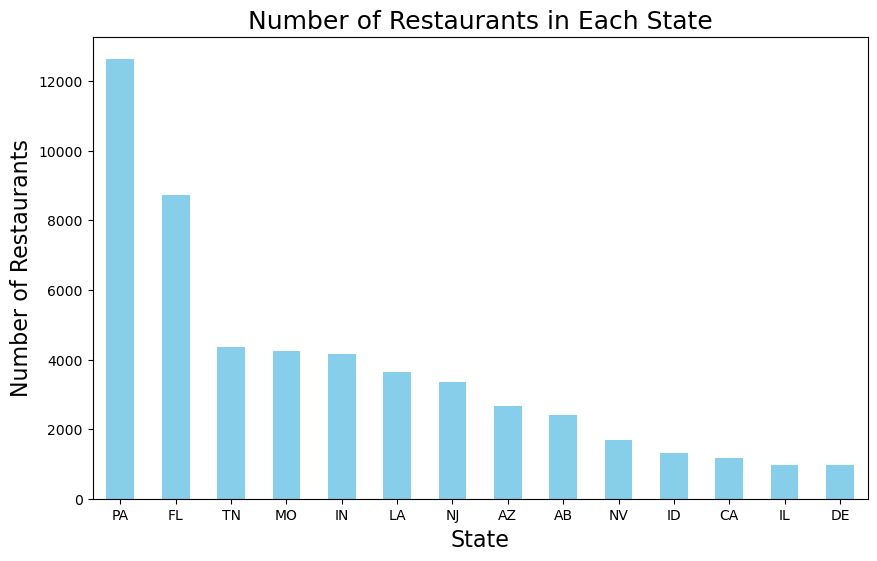

In [16]:
state_counts = dff['state'].value_counts()

plt.figure(figsize=(10, 6))
state_counts.head(14).plot(kind='bar', color='skyblue')
plt.title('Number of Restaurants in Each State', fontsize=18)
plt.xlabel('State',fontsize=16)
plt.ylabel('Number of Restaurants', fontsize=16)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.show()

In [11]:
state_counts

PA     12644
FL      8732
TN      4353
MO      4248
IN      4150
LA      3641
NJ      3343
AZ      2675
AB      2410
NV      1675
ID      1304
CA      1161
IL       983
DE       962
NC         1
CO         1
HI         1
MT         1
XMS        1
Name: state, dtype: int64

In [17]:
df_trip = pd.read_csv("C:/Users/yanfe/OneDrive/Desktop/Trips_by_Distance.csv")

In [20]:
df_trip[df_trip['State Postal Code'] == 'IL']

,Level,Date,State FIPS,State Postal Code,County FIPS,County Name,Population Staying at Home,Population Not Staying at Home,Number of Trips,Number of Trips <1,...,Number of Trips 5-10,Number of Trips 10-25,Number of Trips 25-50,Number of Trips 50-100,Number of Trips 100-250,Number of Trips 250-500,Number of Trips >=500,Row ID,Week,Month
907,State,2019/01/01,17.0,IL,NaN,NaN,3216509.0,9485624.0,37861772.0,10379933.0,...,5323815.0,5015994.0,1896931.0,537863.0,310150.0,86905.0,71777.0,17-00000-20190101,0,1
970,State,2019/01/02,17.0,IL,NaN,NaN,2548222.0,10153911.0,48322386.0,12507348.0,...,7206686.0,7212116.0,2525987.0,582941.0,322723.0,90496.0,64930.0,17-00000-20190102,0,1
1011,State,2019/01/03,17.0,IL,NaN,NaN,2618092.0,10084041.0,49848746.0,12837958.0,...,7549349.0,7397778.0,2571774.0,603484.0,342963.0,101304.0,69630.0,17-00000-20190103,0,1
1062,State,2019/01/04,17.0,IL,NaN,NaN,2552814.0,10149319.0,50485821.0,12737775.0,...,7743386.0,7574824.0,2594318.0,618875.0,363747.0,102505.0,70079.0,17-00000-20190104,0,1
1135,State,2019/01/05,17.0,IL,NaN,NaN,2641840.0,10060293.0,50983681.0,13179166.0,...,7761901.0,7051094.0,2428260.0,634346.0,354626.0,96469.0,63765.0,17-00000-20190105,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5560541,State,2023/10/03,17.0,IL,NaN,NaN,3016804.0,9655017.0,63588132.0,19474304.0,...,9238573.0,8957153.0,2850004.0,711614.0,349078.0,115377.0,79773.0,17-00000-20231003,40,10
5560564,State,2023/10/04,17.0,IL,NaN,NaN,2902832.0,9768989.0,63942078.0,18959958.0,...,9673988.0,9349394.0,2840787.0,654172.0,319429.0,111532.0,78826.0,17-00000-20231004,40,10
5560607,State,2023/10/05,17.0,IL,NaN,NaN,2908714.0,9763107.0,63302883.0,19078523.0,...,9391475.0,9049967.0,2831303.0,654513.0,325654.0,109585.0,78653.0,17-00000-20231005,40,10
5560670,State,2023/10/06,17.0,IL,NaN,NaN,2783726.0,9888095.0,65593825.0,19376883.0,...,9905192.0,9391362.0,2871499.0,737382.0,435148.0,133420.0,84137.0,17-00000-20231006,40,10
